# Coursework 1: Convolutional Neural Networks 
### Autograding
Part 1 of this coursework is autograded. This notebook comes with embedded tests which will verify that your implementations provide outputs with the appropriate types and shapes required for our hidden tests. You can run these same public tests through [LabTS](https://teaching.doc.ic.ac.uk/labts) when you have finished your work, to check that we get the same results when running these public tests.

Hidden tests will be ran after the submission deadline, and cannot be accessed :)

### Setting up working environment 

For this coursework you will need to train a large network, therefore we recommend you work with Google Colaboratory or Lab cluster, where you can access GPUs.

Please refer to the Intro lecture for getting set up on the various GPU options.

**To run the public tests within colab** you will need to copy the "tests" folder to the /content/ directory (this is the default working directory - you can also change directories with %cd). You may also need to place a copy of the CW ipynb in the /content/ directory. A better option is to mount colab on gdrive and keep the files there (so you only need to do the set up once).

#### Setup
You will need to install pytorch and other libraries by running the following cell:

<font color="orange">**The deadline for submission is Tuesday, 6 Feb by 6 pm** </font>

In [1]:
!pip install -q otter-grader pandoc torch torchvision scikit-learn seaborn

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
awscli 1.25.91 requires docutils<0.17,>=0.10, but you have docutils 0.20.1 which is incompatible.


In [2]:
# Initialization Cell
try:
    WORKING_ENV = 'COLAB' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
    USERNAME = 'yh4923' # If working on Lab Machines - Your college username
    assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER']

    if WORKING_ENV == 'COLAB':
        from google.colab import drive
        %load_ext google.colab.data_table
        d1_cw1_repo_path = 'Lectureship/CW/dl_cw1/' # path in your gdrive to the repo
        content_path = f'/content/drive/MyDrive/{d1_cw1_repo_path}' # path to gitrepo in gdrive after mounting
        drive.mount('/content/drive/') # Outputs will be saved in your google drive

    elif WORKING_ENV == 'LABS':
        content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw1/' # You may want to change this
        # Your python env and training data should be on bitbucket
        if 'vol' not in content_path:
            import warnings
            warnings.warn(
                'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
            )

    elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
        # Paperspace does not properly render animated progress bars
        # Strongly recommend using the JupyterLab UI instead of theirs
        !pip install ipywidgets
        content_path = '/notebooks'

    elif WORKING_ENV == 'SAGEMAKER':
        content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/'
    else:
        raise NotImplementedError()

    import otter
    import os
    if not os.path.exists(f'{content_path}tests'):
        raise ValueError('Cannot find the public tests folder')
    grader = otter.Notebook(
        f'{content_path}dl_cw_1.ipynb',
        tests_dir=f'{content_path}tests')
    import matplotlib.pyplot as plt # DO NOT use %matplotlib inline in the notebook
    import numpy as np
    rng_seed = 90
except:
    # This is a fallback initialization for running on LabTS. Please leave this in place before submission.
    import otter
    grader = otter.Notebook("dl_cw_1.ipynb")
    import matplotlib.pyplot as plt
    import numpy as np
    rng_seed = 90
    

## Introduction
In this courswork you will explore various deep learning functionalities through implementing a number of pytorch neural network operations/layers and creating your own deep learning model and methodology for a high dimensional classification problem.

#### Intended learning outcomes
- An understanding of the mechanics behind convolutional, pooling, linear and batch norm operations. 
- Be able to implement convolution, pooling, linear and batch norm layers from basic building blocks.
- Experience designing, implementing and optimising a classifier for a high dimensional dataset.

## Part 1 (50 points)

In this part, you will use basic Pytorch operations to define the 2D convolution, 2D max pooling, linear layer, as well as 2D batch normalization operations. Being computer scientists we care about efficiency, we therefore do not want to see any _for loops_!

**Your Task**
- Implement the forward pass for Conv2D (15 points), MaxPool2D (15 points), Linear (5 points) and BatchNorm2d (15 points)
- You are **NOT** allowed to use the torch.nn modules (The one exception is that the class inherits from nn.Module)

_hint: check out F.unfold and F.fold, they may be helpful_

In [31]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class Conv2d(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 kernel_size,
                 stride=1,
                 padding=0,
                 bias=True):

        super(Conv2d, self).__init__()
        """
        An implementation of a convolutional layer.

        The input consists of N data points, each with C channels, height H and
        width W. We convolve each input with F different filters, where each filter
        spans all C channels and has height H' and width W'.

        Parameters:
        - w: Filter weights of shape (F, C, H', W',)
        - b: Biases of shape (F,)
        - kernel_size: Union[int, (int, int)], Size of the convolving kernel
        - stride: Union[int, (int, int)], Number of pixels between adjacent receptive fields in the
            horizontal and vertical directions.
        - padding: Union[int, (int, int)], Number of pixels that will be used to zero-pad the input.
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Define the parameters used in the forward pass
        self.F = out_channels
        self.C = in_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

        # Do not initialize weights or biases with torch.empty() but rather use torch.zeros()
        # Weights should have shape [out_channels, in_channels, kernel_x, kernel_y]
        if type(kernel_size) == int:
          self.w = nn.Parameter(torch.zeros(self.F, self.C, kernel_size, kernel_size))
        else:
          self.w = nn.Parameter(torch.zeros(self.F, self.C, kernel_size[0], kernel_size[1]))
        # Bias should have shape [out_channels] 
        
        if bias:
          self.b = nn.Parameter(torch.zeros(self.F))
        else:
          self.b = None
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, F, H', W').
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Implement the forward pass
        #                                      #
        N, C, H, W = x.shape
        x_unfold = F.unfold(x, kernel_size=self.kernel_size, stride=self.stride, padding=self.padding)

        # Perform the convolution-like operation
        out_unfold = x_unfold.transpose(1, 2).matmul(self.w.view(self.w.size(0), -1).t()).transpose(1, 2)
        
        if type(self.padding) == int:
          padding_x, padding_y = self.padding, self.padding
        
        if not type(self.padding) == int:
          padding_x, padding_y = self.padding
          
        if type(self.kernel_size) == int:
          kernel_x, kernel_y = self.kernel_size, self.kernel_size
        
        if not type(self.kernel_size) == int:
          kernel_x, kernel_y = self.kernel_size
        
        if type(self.stride) == int:
          stride_x, stride_y = self.stride, self.stride
        
        if not type(self.stride) == int:
          stride_x, stride_y = self.stride

        H_prime =  math.floor(((H - kernel_x + 2 * padding_x) / stride_x + 1))
        W_prime=  math.floor(((W - kernel_y + 2 * padding_y) / stride_y + 1))
        
        # Fold the output back into the original shape of the input tensor
        out = F.fold(out_unfold, (H_prime, W_prime), (1, 1)) 

        # Output plus the bias
        if self.b is not None:
            out += self.b.view(-1, self.F, 1, 1) 

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out 

In [32]:
grader.check("Convolution Layer")

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MaxPool2d(nn.Module):
    def __init__(self, kernel_size):
        super(MaxPool2d, self).__init__()
        """
        An implementation of a max-pooling layer.

        Parameters:
        - kernel_size: Union[int, (int, int)], the size of the window to take a max over
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        self.kernel_size = kernel_size
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, C, H', W').
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        N, C, H, W = x.shape
        x_unfold = F.unfold(x, kernel_size= self.kernel_size, stride=self.kernel_size)

        if type(self.kernel_size) == int:
          kernel_x, kernel_y = self.kernel_size, self.kernel_size
          stride_x, stride_y = self.kernel_size, self.kernel_size
        else:
          kernel_x, kernel_y = self.kernel_size 
          stride_x, stride_y = self.kernel_size 

        x_unfold = x_unfold.view(N, C, int(x_unfold.shape[1]/C), -1).max(2)[0]

        H_prime = int((H - kernel_x) / stride_x + 1)
        W_prime = int((W - kernel_y) / stride_y + 1)
        
        out = F.fold(x_unfold, (H_prime, W_prime), (1, 1))
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out


In [6]:
grader.check("MaxPool Layer")

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed

In [7]:
class Linear(nn.Module):
    def __init__(self, in_channels, out_channels, bias=True):
        super(Linear, self).__init__()
        """
        An implementation of a Linear layer.

        Parameters:
        - weight: the learnable weights of the module of shape (in_channels, out_channels).
        - bias: the learnable bias of the module of shape (out_channels).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # self.register_parameter is not used as it was mentioned on piazza
        # that this will be overridden
        # Also no initialisation methods for this reason
        self.w = nn.Parameter(torch.zeros(in_channels, out_channels))
        self.bias = bias

        if bias:
            self.b = nn.Parameter(torch.zeros(out_channels))
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, *, H) where * means any number of additional
        dimensions and H = in_channels
        Output:
        - out: Output data of shape (N, *, H') where * means any number of additional
        dimensions and H' = out_channels
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        out = torch.matmul(x,self.w)
        if self.bias:
            out += self.b
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [8]:
grader.check("Linear Layer")

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

In [9]:
class BatchNorm2d(nn.Module):
	def __init__(self, num_features, eps=1e-05, momentum=0.1):
		super(BatchNorm2d, self).__init__()
		"""
		An implementation of a Batch Normalization over a mini-batch of 2D inputs.

		The mean and standard-deviation are calculated per-dimension over the
		mini-batches and gamma and beta are learnable parameter vectors of
		size num_features.

		Parameters:
		- num_features: C from an expected input of size (N, C, H, W).
		- eps: a value added to the denominator for numerical stability. Default: 1e-5
		- momentum: the value used for the running_mean and running_var
		computation. Default: 0.1 . (i.e. 1-momentum for running mean)
		- gamma: the learnable weights of shape (num_features).
		- beta: the learnable bias of the module of shape (num_features).
		"""
		# TODO: Define the parameters used in the forward pass                 #
		# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
		self.num_features = num_features
		self.eps = eps
		self.momentum = momentum

		# self.register_parameter is not used as it was mentioned on piazza
		# that this will be overridden
		self.gamma =  nn.Parameter(torch.zeros(num_features))
		self.beta =  nn.Parameter(torch.zeros(num_features))
		self.running_mean = torch.zeros(num_features)
		self.running_var = torch.ones(num_features)

		# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

	def forward(self, x):
		"""
		During training this layer keeps running estimates of its computed mean and
		variance, which are then used for normalization during evaluation.
		Input:
		- x: Input data of shape (N, C, H, W)
		Output:
		- out: Output data of shape (N, C, H, W) (same shape as input)
		"""
		# TODO: Implement the forward pass                                     #
		#       (be aware of the difference for training and testing)          #
		# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
		#print("shape orig", x.shape)

		if self.training:
			batch_mean = x.mean(dim=(0, 2, 3)) #, keepdim=True)
			#batch_mean =  x.mean(dim=0)
			batch_var = x.var(dim=(0, 2, 3), unbiased=False) #, keepdim=True)
			batch_var_unbias = x.var(dim=(0, 2, 3), unbiased=True)
			#batch_var =  x.var(dim=0)

			# Update running mean and variance using momentum
			self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * batch_mean
			self.running_var = (1 - self.momentum) * self.running_var + self.momentum * batch_var_unbias

		else:

			batch_mean = self.running_mean
			batch_var = self.running_var
			print(batch_mean.shape)

		#x_norm = (x - batch_mean) / torch.sqrt(batch_var + self.eps)
		x_norm = (x -batch_mean.view(1, -1, 1, 1)) / torch.sqrt(batch_var.view(1, -1, 1, 1) + self.eps)

		#x = x_norm*self.gamma.unsqueeze(0).unsqueeze(2).unsqueeze(3) + self.beta.unsqueeze(0).unsqueeze(2).unsqueeze(3)
		x = x_norm*self.gamma.view(1, -1, 1, 1) + self.beta.view(1, -1, 1, 1)

		return x


In [10]:
grader.check("BatchNorm Layer")

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

## Part 2 (40 points)

In this part, you will design, train and optimise a custom deep learning model for classifying a specially selected subset of Imagenet. Termed NaturalImageNet, it is made up of a hand selected subset of the famous ImageNet dataset. The dataset contains 20 classes, all animals from the natural world. We hope that this dataset will be fun to work with but also a challenge.

You will be marked on your experimental process, methods implemented and your reasoning behind your decisions. While there will be marks for exceeding a baseline performance score we stress that students should **NOT** spend excessive amounts of time optimising performance to silly levels.

We have given you some starter code, please feel free to use and adapt it.

**Your Task**
1. Develop/adapt a deep learning pipeline to maximise performance on the test set. (28 points)
    * 8 points will be awarded for improving on the baseline score on the test set. Don't worry you can get full marks here by improving by a minor amount.
    * 20 points will be awarded for the adaptations made to the baseline model and pipeline.

2. Answer the qualititative questions (12 points)

**Downloading NaturalImageNet**

In [11]:
ON_COLAB = False

!wget https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
!wget https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
if ON_COLAB:
    !unzip /content/NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip /content/NaturalImageNetTrain.zip?download=1 > /dev/null
else: 
    !unzip NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip NaturalImageNetTrain.zip?download=1 > /dev/null

--2024-02-05 23:56:17--  https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.103.159, 188.184.98.238, 188.185.79.172, ...
Connecting to zenodo.org (zenodo.org)|188.184.103.159|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/5846979/files/NaturalImageNetTest.zip [following]
--2024-02-05 23:56:17--  https://zenodo.org/records/5846979/files/NaturalImageNetTest.zip
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 138507970 (132M) [application/octet-stream]
Saving to: ‘NaturalImageNetTest.zip?download=1.11’

NaturalImageNetTest 100%[===================>] 132.09M  13.4MB/s    in 9.1s    

2024-02-05 23:56:27 (14.5 MB/s) - ‘NaturalImageNetTest.zip?download=1.11’ saved [138507970/138507970]

--2024-02-05 23:56:27--  https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
Resolving zenodo.org (zenodo.org)

In [12]:
#torch
import torch
from torch.nn import Conv2d, MaxPool2d
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
#other
import matplotlib.pyplot as plt
import numpy as np
# set the seed for reproducibility
rng_seed = 90
torch.manual_seed(rng_seed)

In [13]:
# When we import the images we want to first convert them to a tensor. 
# It is also common in deep learning to normalise the the inputs. This 
# helps with stability.
# To read more about this subject this article is a great one:
# https://towardsdatascience.com/understand-data-normalization-in-machine-learning-8ff3062101f0

# transforms is a useful pytorch package which contains a range of functions
# for preprocessing data, for example applying data augmentation to images 
# (random rotations, blurring the image, randomly cropping the image). To find out
# more please refer to the pytorch documentation:
# https://pytorch.org/docs/stable/torchvision/transforms.html
import os
ON_COLAB = False
print(os.listdir())
mean = torch.Tensor([0.485, 0.456, 0.406])
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]
    )
#train_path = ('/content/' if ON_COLAB else '') + 'NaturalImageNetTrain'
#test_path = ('/content/' if ON_COLAB else '') +'NaturalImageNetTest'
train_path = ('/content/' if ON_COLAB else '') + 'NaturalImageNetTrain'
test_path = ('/content/' if ON_COLAB else '') +'NaturalImageNetTest'

train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

# Create train val split
n = len(train_dataset)
#weights = torch.tensor(
n_val = int(n/10)

train_set, val_set = torch.utils.data.random_split(train_dataset, [n-n_val, n_val])


print(len(train_set), len(val_set), len(test_dataset))


# The number of images to process in one go. If you run out of GPU
# memory reduce this number! 
batch_size = 64

# Dataloaders are a great pytorch functionality for feeding data into our AI models.
# see https://pytorch.org/docs/stable/data.html?highlight=dataloader#torch.utils.data.DataLoader
# for more info.

loader_train = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_val = DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

['NaturalImageNetTest.zip?download=1', 'cartoons.zip?download=1', 'NaturalImageNetTest.zip', 'NaturalImageNetTrain.zip', 'NaturalImageNetTrain.zip?download=1.11', 'NaturalImageNetTest', 'NaturalImageNetTrain.zip?download=1.6', 'cartoons', 'NaturalImageNetTrain.zip?download=1.5', 'cartoons.zip?download=1.3', 'model.pt', 'NaturalImageNetTest.zip?download=1.6', 'NaturalImageNetTest.zip?download=1.11', 'NaturalImageNetTrain.zip?download=1.3', 'modelfinaloeig.pt', 'NaturalImageNetTest.zip?download=1.7', 'NaturalImageNetTest.zip?download=1.9', 'NaturalImageNetTrain.zip?download=1.10', 'NaturalImageNetTrain.zip?download=1.7', 'NaturalImageNetTrain', 'NaturalImageNetTest.zip?download=1.8', 'NaturalImageNetTrain.zip?download=1.9', 'model_noweight.pt', 'NaturalImageNetTest.zip?download=1.10', 'NaturalImageNetTest.zip?download=1.3', 'NaturalImageNetTrain.zip?download=1.2', 'NaturalImageNetTrain.zip?download=1.8', 'NaturalImageNetTrain.zip?download=1.4', 'NaturalImageNetTest.zip?download=1.4', 'ca

In [14]:
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x):
    '''
    Function to reverse the normalization so that we can visualise the outputs
    '''
    x = unnormalize(x)
    x = x.view(x.size(0), 3, 256, 256)
    return x

def show(img):
    '''
    function to visualise tensors
    '''
    if torch.cuda.is_available():
        img = img.cpu()
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)).clip(0, 1))

**Visualising some example images** 

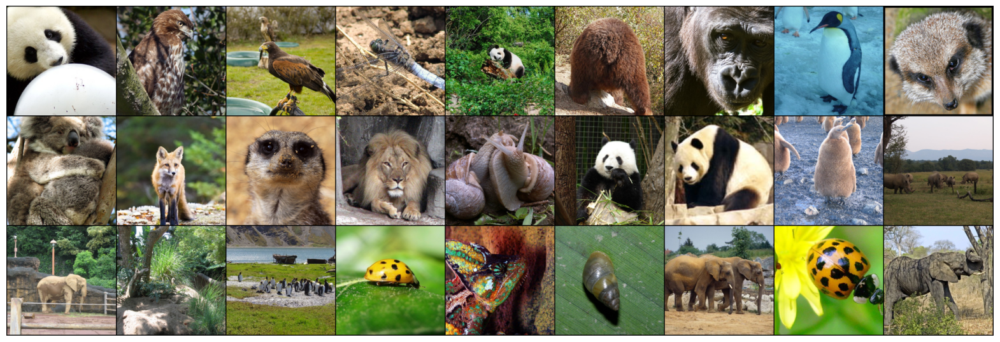

In [15]:
sample_inputs, _ = next(iter(loader_val))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Next, we define ResNet-18:

In [16]:
# define resnet building blocks

class ResidualBlock(nn.Module): 
    def __init__(self, inchannel, outchannel, stride=1): 
        
        super(ResidualBlock, self).__init__() 
        
        self.left = nn.Sequential(Conv2d(inchannel, outchannel, kernel_size=3, 
                                         stride=stride, padding=1, bias=False), 
                                  nn.BatchNorm2d(outchannel), 
                                  nn.ReLU(inplace=True), 
                                  Conv2d(outchannel, outchannel, kernel_size=3, 
                                         stride=1, padding=1, bias=False), 
                                  nn.BatchNorm2d(outchannel)) 
        
        self.shortcut = nn.Sequential() 
        
        if stride != 1 or inchannel != outchannel: 
            
            self.shortcut = nn.Sequential(Conv2d(inchannel, outchannel, 
                                                 kernel_size=1, stride=stride, 
                                                 padding = 0, bias=False), 
                                          nn.BatchNorm2d(outchannel) ) 
            
    def forward(self, x, activation_func = "LeakyRelu"): 
        
        out = self.left(x) 
        
        out += self.shortcut(x) 
        
        if activation_func == "LeakyRelu":
            out = F.leaky_relu(out, negative_slope=0.01)
            
        elif activation_func == "Elu":
            out = F.elu(out,alpha=1)
            
        elif activation_func == "Tanh":
            out = F.torch.tanh(out)
        else:
            out = F.relu(out) 
        
        return out
    
# define resnet

class ResNet(nn.Module):
    
    def __init__(self, ResidualBlock,num_classes = 20):
        
        super(ResNet, self).__init__()
        
        self.inchannel = 16
        self.conv1 = nn.Sequential(Conv2d(3, 16, kernel_size = 3, stride = 1,
                                            padding = 1, bias = False), 
                                  nn.BatchNorm2d(16), 
                                  nn.ReLU())
        
        self.layer1 = self.make_layer(ResidualBlock, 128, 1, stride = 2)
        self.layer2 = self.make_layer(ResidualBlock, 128, 1, stride = 2)
        self.layer3 = self.make_layer(ResidualBlock, 256, 1, stride = 2)
        self.layer4 = self.make_layer(ResidualBlock, 256, 1, stride = 2)
        self.layer5 = self.make_layer(ResidualBlock, 512, 1, stride = 2)
        self.layer6 = self.make_layer(ResidualBlock, 512, 1, stride = 2)
        
        self.maxpool = MaxPool2d(4)
        
        #self.fc1 = Linear(512,512)
        self.fc = Linear(512, num_classes)
    
    def make_layer(self, block, channels, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        
        layers = []
        
        for stride in strides:
            
            layers.append(block(self.inchannel, channels, stride))
            
            self.inchannel = channels
            
        return nn.Sequential(*layers)
    
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)
        #x = self.fc1(x)
        x = self.fc(x)
        return x
    
# please do not change the name of this class
def MyResNet():
    return ResNet(ResidualBlock)

In [17]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
#set seed for reproducability

def confusion(preds, y):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # Plotting the confusion matrix
  cm = confusion_matrix(y.cpu().numpy(), preds.cpu().numpy(), normalize='true')
  fig, ax= plt.subplots(1, 1, figsize=(15,10))
  sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

  # labels, title and ticks
  ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
  ax.set_title('Confusion Matrix');
  ax.xaxis.set_ticklabels(labels, rotation = 70); ax.yaxis.set_ticklabels(labels, rotation=0);
  plt.show()

def incorrect_preds(preds, y, test_img):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # lets see a sample of the images which were classified incorrectly!
  correct = (preds == y).float()
  test_labels_check = correct.cpu().numpy()
  incorrect_indexes = np.where(test_labels_check == 0)

  test_img = test_img.cpu()
  samples = make_grid(denorm(test_img[incorrect_indexes][:9]), nrow=3,
                      padding=2, normalize=False, value_range=None, 
                      scale_each=False, pad_value=0)
  plt.figure(figsize = (20,10))
  plt.title('Incorrectly Classified Instances')
  show(samples)
  labels = np.asarray(labels)
  print('Predicted label',labels[preds[incorrect_indexes].cpu().numpy()[:9]])
  print('True label', labels[y[incorrect_indexes].cpu().numpy()[:9]])
  print('Corresponding images are shown below')

In [18]:
USE_GPU = True
dtype = torch.float32 


if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print(device)   

print_every = 10
def check_accuracy(loader, model, analysis=False):
    # function for test accuracy on validation and test set
    
    num_correct = 0
    num_samples = 0
    model.eval()  # set model to evaluation mode
    with torch.no_grad():
        for t, (x, y) in enumerate(loader):
            x = x.to(device=device, dtype=dtype)  # move to device
            y = y.to(device=device, dtype=torch.long)
            scores = model(x)
            _, preds = scores.max(1)
            num_correct += (preds == y).sum()
            num_samples += preds.size(0)
            if t == 0 and analysis:
              stack_labels = y
              stack_predicts = preds
            elif analysis:
              stack_labels = torch.cat([stack_labels, y], 0)
              stack_predicts = torch.cat([stack_predicts, preds], 0)
        acc = float(num_correct) / num_samples
        print('Got %d / %d correct of val set (%.2f)' % (num_correct, num_samples, 100 * acc))
        if analysis:
          print('check acc', type(stack_predicts), type(stack_labels))
          confusion(stack_predicts, stack_labels)
          incorrect_preds(preds, y, x)
        return float(acc)

        

def train_part(model, optimizer, weights=None, epochs=1):
    """
    Train a model on NaturalImageNet using the PyTorch Module API.
    
    Inputs:
    - model: A PyTorch Module giving the model to train.
    - optimizer: An Optimizer object we will use to train the model
    - epochs: (Optional) A Python integer giving the number of epochs to train for
    
    Returns: Nothing, but prints model accuracies during training.
    """
    if weights is not None:   
        weights = weights.to(device)

    model = model.to(device=device)  # move the model parameters to CPU/GPU
   
    #getting weights
    num_classes = 20
    
    for e in range(epochs):
        for t, (x, y) in enumerate(loader_train):
            model.train()  # put model to training mode
            x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
            y = y.to(device=device, dtype=torch.long)

            scores = model(x)
            
            if weights is not None:
                # Use weighted cross-entropy loss
                loss = F.cross_entropy(scores, y, weight=weights)
            else:
                # Use regular cross-entropy loss
                loss = F.cross_entropy(scores, y)

            # Zero out all of the gradients for the variables which the optimizer
            # will update.
            optimizer.zero_grad()

            loss.backward()

            # Update the parameters of the model using the gradients
            optimizer.step()

            if t % print_every == 0:
                print('Epoch: %d, Iteration %d, loss = %.4f' % (e, t, loss.item()))
        check_accuracy(loader_val, model)

cuda:0


Total number of parameters is: 11314148
Epoch: 0, Iteration 0, loss = 2.9957
Epoch: 0, Iteration 10, loss = 2.8137
Epoch: 0, Iteration 20, loss = 2.9930
Epoch: 0, Iteration 30, loss = 2.7264
Epoch: 0, Iteration 40, loss = 2.5766
Epoch: 0, Iteration 50, loss = 2.7598
Epoch: 0, Iteration 60, loss = 2.6050
Epoch: 0, Iteration 70, loss = 2.5549
Epoch: 0, Iteration 80, loss = 2.5119
Epoch: 0, Iteration 90, loss = 2.5570
Epoch: 0, Iteration 100, loss = 2.5180
Epoch: 0, Iteration 110, loss = 2.5247
Epoch: 0, Iteration 120, loss = 2.2943
Epoch: 0, Iteration 130, loss = 2.2020
Epoch: 0, Iteration 140, loss = 2.3043
Epoch: 0, Iteration 150, loss = 2.0463
Epoch: 0, Iteration 160, loss = 2.1714
Epoch: 0, Iteration 170, loss = 2.2571
Epoch: 0, Iteration 180, loss = 2.0951
Epoch: 0, Iteration 190, loss = 2.2064
Epoch: 0, Iteration 200, loss = 2.0704
Epoch: 0, Iteration 210, loss = 1.9205
Epoch: 0, Iteration 220, loss = 2.0082
Epoch: 0, Iteration 230, loss = 2.1653
Epoch: 0, Iteration 240, loss = 1.8

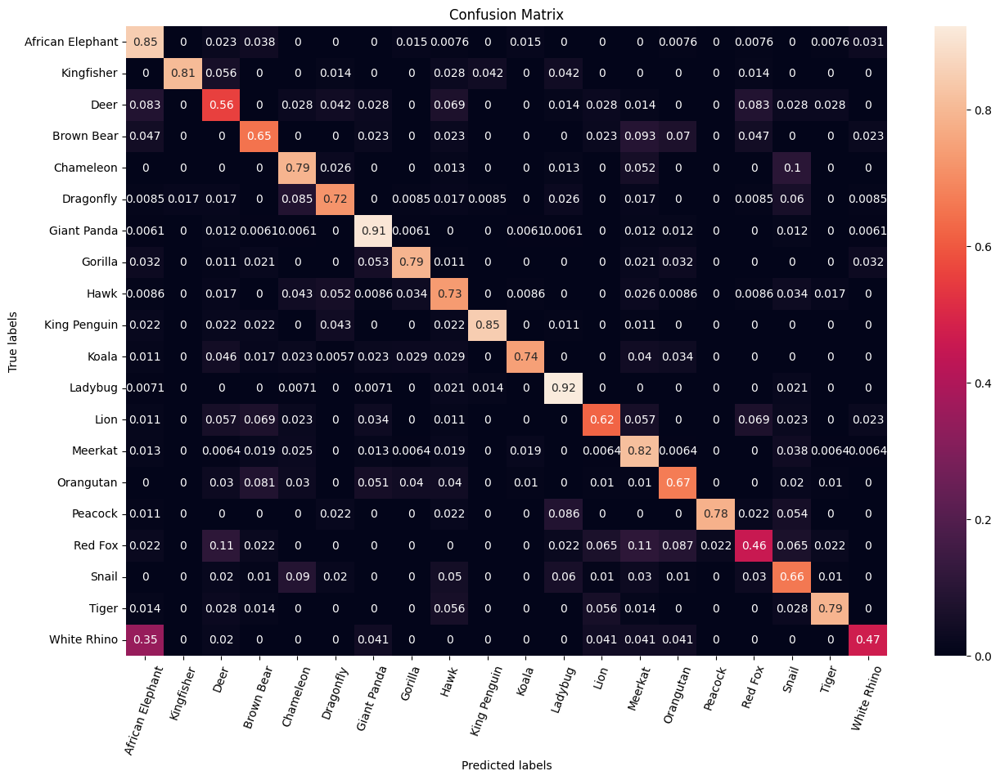

Predicted label ['African Elephant' 'African Elephant' 'Chameleon' 'Brown Bear' 'Hawk'
 'Gorilla' 'Meerkat']
True label ['White Rhino' 'White Rhino' 'Snail' 'Tiger' 'Meerkat' 'Koala' 'Lion']
Corresponding images are shown below


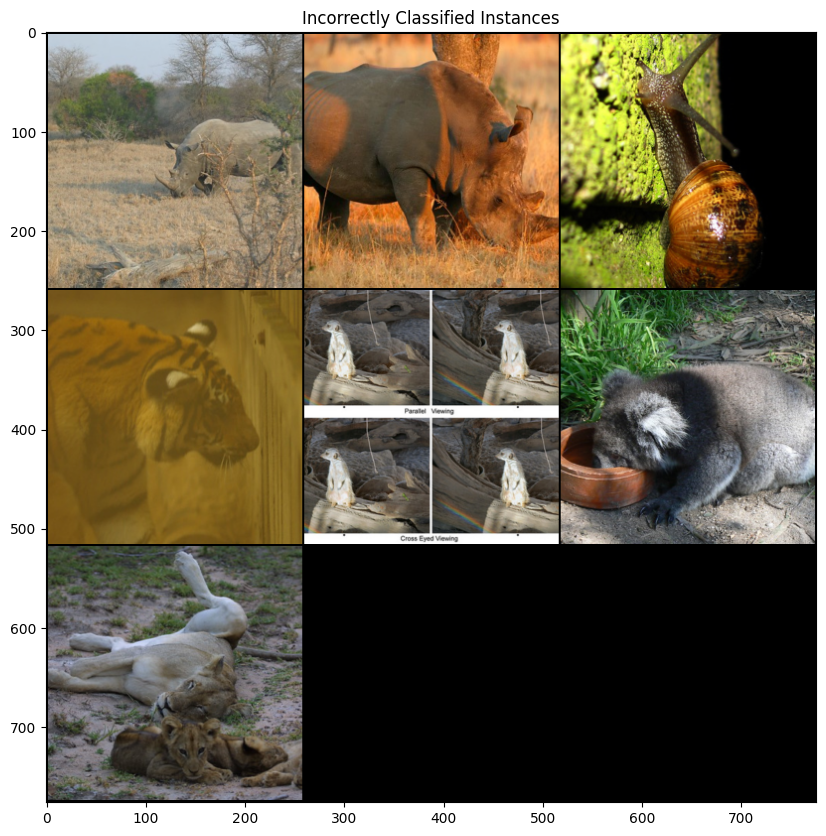

In [19]:
# define and train the network
model_noweight = MyResNet()
optimizer = optim.Adamax(model_noweight.parameters(), lr=0.001, weight_decay=1e-9) 

params = sum(p.numel() for p in model_noweight.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

train_part(model_noweight, optimizer, epochs = 10)

# report test set accuracy
check_accuracy(loader_val, model_noweight, analysis=True)

# save the model
torch.save(model_noweight.state_dict(), 'model_noweight.pt')

In [20]:

# Get the class to index mapping
class_to_idx = train_dataset.class_to_idx

# Initialize a list to store samples for each class
class_samples_list = [[] for _ in range(len(class_to_idx))]

# Populate the list with samples using os
for root, dirs, files in os.walk(train_path):
    for file in files:
        class_name = os.path.basename(root)
        class_idx = class_to_idx[class_name]
        class_samples_list[class_idx].append(os.path.join(root, file))
tot = 0
weights = []
info = []
# Print the result
for class_idx, samples in enumerate(class_samples_list):
    class_name = [name for name, idx in class_to_idx.items() if idx == class_idx][0]
    num_samples = len(samples)
    tot+=num_samples
    weights.append(num_samples)
    info.append((class_name,num_samples))
    #print(f"Class {class_name}: {len(samples)} samples")
    #print(samples[:5])  # Print the first 5 samples for demonstration
weights = tot/torch.tensor(weights)
print(info)
print("")
print(weights)


[('African elephant', 1371), ('Eurasiankingfisher', 732), ('Virginia deer', 835), ('brown bear', 548), ('chameleon', 747), ('dragonfly', 1224), ('giant panda', 1364), ('gorilla', 1111), ('hawk', 1207), ('king penguin', 956), ('koala', 1599), ('ladybug', 1415), ('lion', 891), ('meerkat', 1438), ('orangutan', 923), ('peacock', 916), ('red fox', 426), ('snail', 1018), ('tiger', 751), ('white rhinoceros', 512)]

tensor([14.5762, 27.3005, 23.9329, 36.4672, 26.7523, 16.3268, 14.6510, 17.9874,
        16.5568, 20.9038, 12.4978, 14.1230, 22.4287, 13.8971, 21.6511, 21.8166,
        46.9108, 19.6306, 26.6099, 39.0312])


Total number of parameters is: 11314148
Epoch: 0, Iteration 0, loss = 2.9957
Epoch: 0, Iteration 10, loss = 3.0440
Epoch: 0, Iteration 20, loss = 2.9556
Epoch: 0, Iteration 30, loss = 2.7551
Epoch: 0, Iteration 40, loss = 2.8315
Epoch: 0, Iteration 50, loss = 2.6045
Epoch: 0, Iteration 60, loss = 2.7015
Epoch: 0, Iteration 70, loss = 2.7496
Epoch: 0, Iteration 80, loss = 2.7727
Epoch: 0, Iteration 90, loss = 2.5764
Epoch: 0, Iteration 100, loss = 2.6758
Epoch: 0, Iteration 110, loss = 2.5305
Epoch: 0, Iteration 120, loss = 2.4272
Epoch: 0, Iteration 130, loss = 2.4231
Epoch: 0, Iteration 140, loss = 2.4871
Epoch: 0, Iteration 150, loss = 2.4538
Epoch: 0, Iteration 160, loss = 2.6733
Epoch: 0, Iteration 170, loss = 2.4101
Epoch: 0, Iteration 180, loss = 2.2491
Epoch: 0, Iteration 190, loss = 2.4671
Epoch: 0, Iteration 200, loss = 2.3286
Epoch: 0, Iteration 210, loss = 2.2427
Epoch: 0, Iteration 220, loss = 2.1372
Epoch: 0, Iteration 230, loss = 2.4190
Epoch: 0, Iteration 240, loss = 2.4

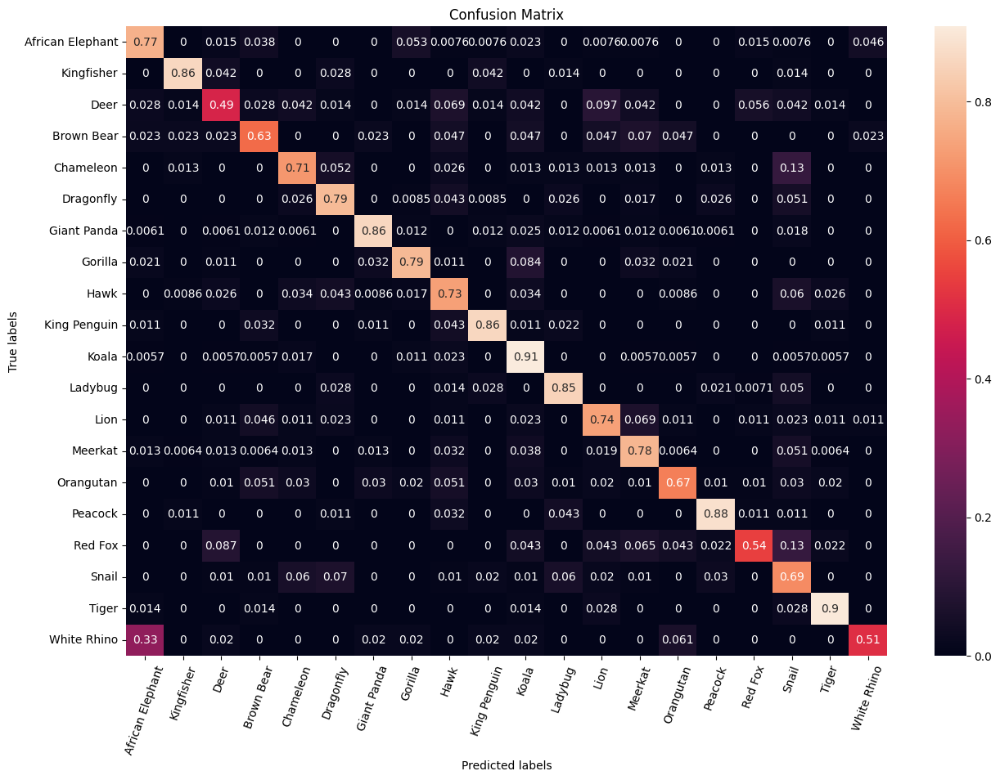

Predicted label ['Snail' 'Koala' 'Gorilla' 'Tiger' 'Giant Panda']
True label ['Meerkat' 'Orangutan' 'Giant Panda' 'Hawk' 'Gorilla']
Corresponding images are shown below


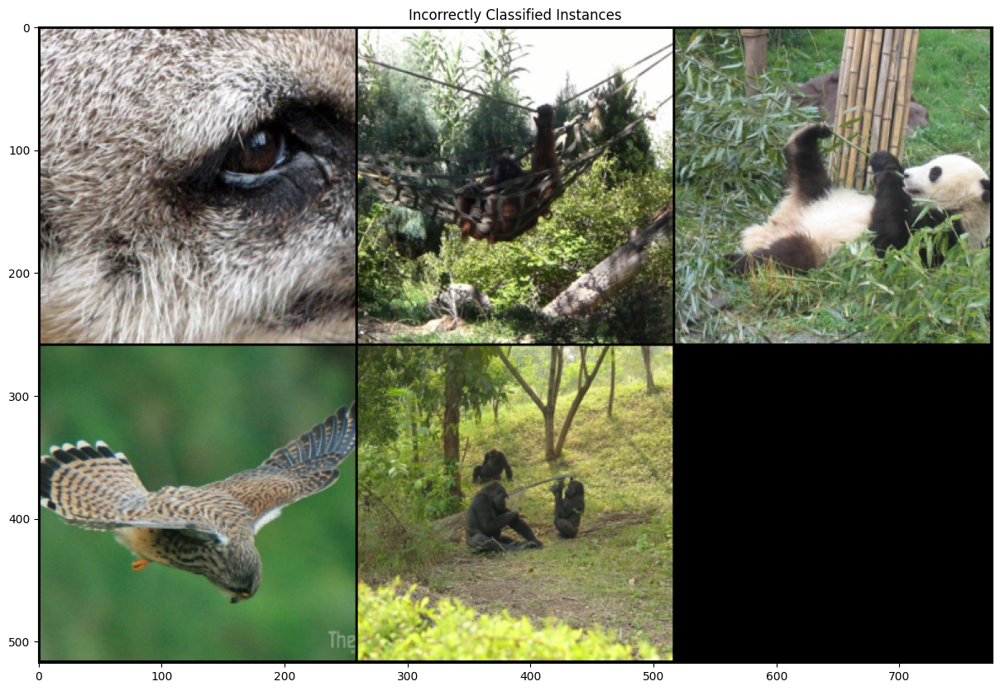

In [21]:
# define and train the network
model = MyResNet()
optimizer = optim.Adamax(model.parameters(), lr=0.001, weight_decay=1e-9) 

weights = torch.tensor([14.5762, 27.3005, 23.9329, 36.4672, 26.7523, 16.3268, 14.6510, 17.9874,
    16.5568, 20.9038, 12.4978, 14.1230, 22.4287, 13.8971, 21.6511, 21.8166,
    46.9108, 19.6306, 26.6099, 39.0312])

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

train_part(model, optimizer, weights=weights, epochs = 10)

# report test set accuracy
check_accuracy(loader_val, model, analysis=True)

# save the model
torch.save(model.state_dict(), 'model.pt')

---

<!-- BEGIN QUESTION -->

### Network Performance

Run the code below when all engineering decisions have been made, do not overfit to the test set!

**Note that** this will appear in the output, and be checked by markers (so ensure it is present in the auto-export)

Got 1511 / 2000 correct of val set (75.55)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


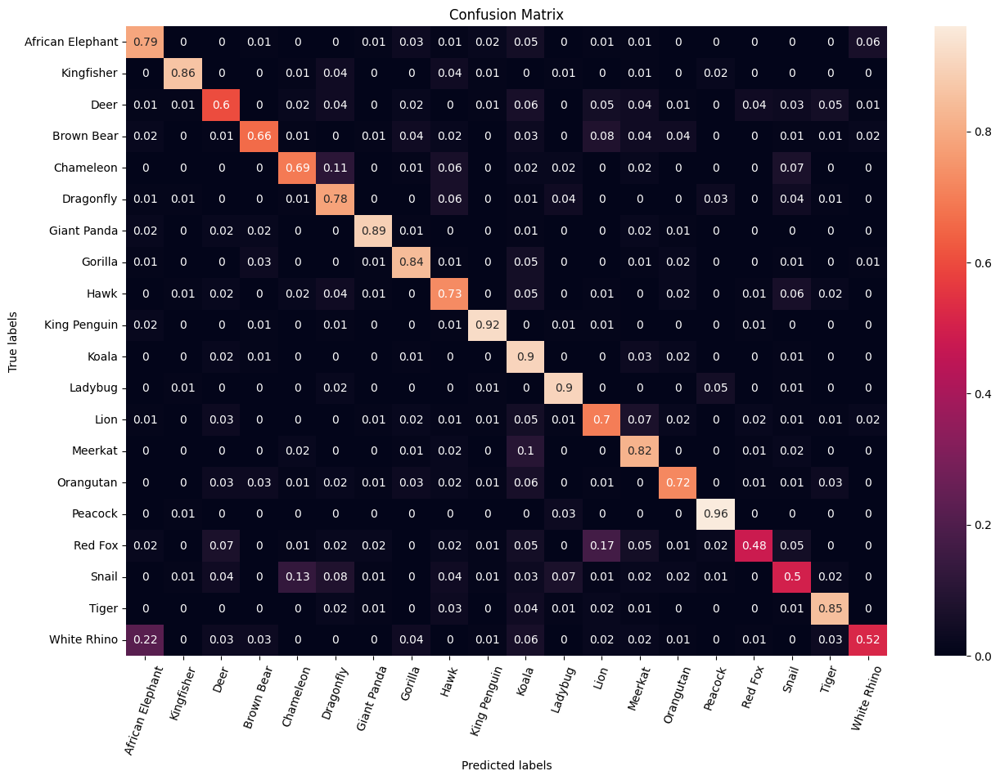

Predicted label ['Koala' 'Dragonfly' 'Koala']
True label ['Hawk' 'Chameleon' 'Red Fox']
Corresponding images are shown below


0.7555

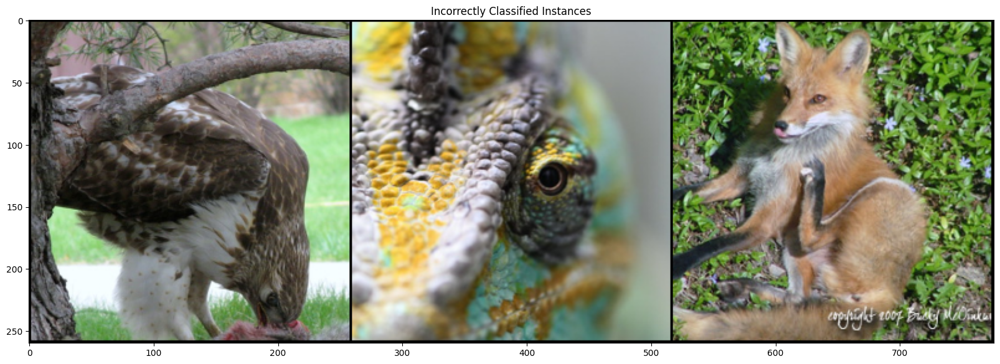

In [22]:
        # Run once your have trained your final model
check_accuracy(loader_test, model, analysis=True)

___

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.1: Hyperparameter Search:
Given such a network with a large number of trainable parameters, and a training set of a large number of data, what do you think is the best strategy for hyperparameter searching? (3 points)

**Answer:**


Given a network with a large number of trainable parameters and a substantial training set, I believe the most effective hyperparameter search strategy would be a randomized search. A grid search, due to its computational expense and time-consuming nature, would be too costly given the limited time and GPU resources. A randomized search, while covering fewer possibilities, is less computationally expensive.

The strategy involves closely monitoring validation accuracy for every epoch to identify signs of underfitting or overfitting. It is also important to consider whether a highly complex model is needed to capture the underlying pattern in the data, as simplifying the model may require fewer iterations for achieving good generalization. Given the potential for overfitting with the large number of parameters, experimenting with different regularization techniques can also be helpful.

It would also be beneficial to look at existing deep learning architectures that pertain to the type of problem you are trying to solve to draw ideas from a starting point.



---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.2: Engineering Decisions 

Detail which engineering decisions you made to boost the performance of the baseline results. Why do you think that they helped? (7 points)

**Answer:**

Below, I will outline the engineering decisions I made when tuning the architecture of my ResNet model to boost the baseline results. I will present these decisions in the order I made them, to demonstrate how I arrived at the final architecture.

**Number of Neurons Per Layer:**

Rather than increasing or decreasing the number of layers in a CNN, I decided to experiment with the number of Neurons per layer. The original architecture, had a validation accuracy of 38.99, and the model appeared to have been learning very slowly and potentially have been  and not learning the the patterns within the data well. Moreover, the number of parameters for the baseline model is 11,204,164. The original architecture was [32, 64, 128, 256, 512] which is equivalent to [$2^4, 2^5, 2^6, 2^7, 2^8, 2^9$], so the number of neurons were in powers of two. After further investigation, from the nvidia docs (https://docs.nvidia.com/deeplearning/performance/dl-performance-convolutional/index.html) I found that we should "Choose the number of input and output channels to be divisible by 8 (for FP16) or 4 (for TF32) to run efficiently on Tensor Cores". Therefore I decided to experiment with different number of neurons in powers of two that would increase the number of parameters hence the complexity of the model to better capture patterns. 

I decided to experiment with the following architectures in the order below, that gave me the following accuracy:
1. [$2^4,2^5,2^7,2^7, 2^8, 2^9$] validation accuracy of 36.94 and the total number of parameters is 11,638,980. The model did not appear to be learning well as the validation accuracy from epoch 1-10 was 32.78 to 36.94. Therefore, I decided to next try increasing the number of neurons in the first initial layers, since more features could potentially better capture the complexity of the data.
2. [$2^6,2^6,2^7,2^7, 2^8, 2^9$] - validation accuracy 48.10 and the total number of parameters is 11,910,884. I noticed that after the second epoch, where the validation accuracy is 44.04, the model is not learning very well as the validation accuracy would go up 1-2% per iteration and in for some epochs go down a bit. Therefore I to try increasing the number of neurons in the hidden layers to see if the model could learn more complex features without potentially overfitting.
3. [$2^6,2^7,2^8,2^8, 2^9, 2^9$] validation accuracy of and the total number of parameters was 51.65 with the total number of parameters being 23,283,044
4. [$2^7,2^7,2^8,2^8, 2^9, 2^9$]  - I tried increasing the number of neurons in the first layer to see if the pattern of every two subsequant layers having the same number neurons worked better. I had a validation accuracy of 55.06 with the total number of parameters being 23707620. I chose this as the final neuron architecture because  it had the highest validation accuracy. 

**Learning Rate**

Since, the model did appear to still be learning slowly, as after the second or third epoch, every epoch increases the validation accuracy by a couple of percent, I decided to try increasing the learning rate to 0.001 from 0.0001 and this brought the resulting validation accuracy to 65.02. Therefore, I kept 0.001 as the learning rate. 

**Batch size**

The original batch size is 128, therefore I decided to try decreasing the batch size because I tried decreasing to 64 batch size gave an accuracy 70.32, this makes sense since smaller batch sizes lead to more frequent updates of the weights during training. At this stage of the engineering process, I decided to not try further increasing the batch size due to the increased training  I was not able to try increasing the batch size due to memory limitations. 

**Weight Decay:**

The original weight decay is 1e-7. First I tried increasing the weight decay to 1e-6, but then the validation accuracy dropped to 66.12. Then I tried 1e-8 and it gave a validation accuracy of 70.97 and then further decreasing it to 1e-9 gave a validation accuracy of 73.37. Therefore I kept 1e-9 as the final weight decay. I think this is because the weight decay determines how much to penalize the magnitude of the parameters to prevent overfitting so having a larger weight decay may excessively penalize parameter values, leading to suboptimal performance.

**Activation Function**

Since activation functions enable the model to learn non-linear relationships within the data, I wanted to experiment with some different activation functions to see if they could help the model better capture complex relationships within the data. I did notice that for several epochs throughout training the validation accuracy would not increase. I wasn't sure if this was a result of the "dying relu problem" when the neurons using ReLU become inactive during training and consistently output zero. I decided to experiment with LeakyRelu and ELu for the forward pass and both were designed to address the "dying ReLU" problem.  I tried LeakyRelu with a non-zero slope of 0.1 for negative inputs and got an accuracy of 75.18. I tried Elu with the alpha parameter set to 1 and I got 73.92. I also decided to try the Tanh activation function and got a validation accuracy of 67.02. I did notice that there weren't epochs anymore where the validation accuracy would increase by less than 1%, although there was still a sign of overfitting where validation accuracy would dip then increase again. Therefore I kept LeakyRelu for the activation function of the forward pass.

**Optimizer**

The current optimizer being used was Adamax, which was a special case of Adam's optimizer. Thus, I decided to try the Adam Optimizer as well but the validation accuracy dropped to 61.76. Therefore I decided to keep Adamax as the optimizer. 

**Block size**

The original block sizes of the original is [2,2,2,2,2,2]. I decided to experiment with block sizes of [1,1,1,1,1,1] since having block sizes of one could help prevent overfitting and block sizes of [3,3,3,3,3,3] to see if further increasing the complexity (number of parameters) of the model by increasing the blocksize will improve performance. Block size of 1 gave me a validation accuracy of 75.93, and block sizes of 3 for all layers resulted in a validation accuracy of 72.22. Therefore I left the block sizes as [1,1,1,1,1] for the final architecture. Having a block size of [1,1,1,1,1,1] also resulted in a model with about half as many parameters as the original set of block sizes, and gives us a resulting model with 11,314,148 parameters again. Moreover, for the final model, the training processes also appeared more stable as the validation accuracy was consistently increasing. It also reduced the complexity of the model and the computational cost of each training run.  This also makes sense because there are fewer parameters so the model may not be overfitting as much as previously sometimes the validation accuracy would decrease for an epoch prior to increasing again, indicating the model may have been overfitting.

**Loss Function**

I kept categorical cross entropy loss as the loss function because it is a widely used and well suited loss for multi-classification problems, which is what we are dealing with. Moreover, I did notice that the dataset was quite imbalanced. The sample sizes for each of the classes ranged from Upon inspection of the training set, the class with the highest number of samples was “Meerkhat” and it had 1438 samples, moreover, the class with the lowest number of samples was “Red Fox”, and it has 426 samples. I also noticed that "Red Fox", and "White Rhino", which only had 512 samples in the training data, had the lowest number of correctly classified instances from the confusion matrix which were 46% and 47%, respectively. Therefore I decided to try a weighted categorical cross entropy loss function to increase the contribution of underrepresented classes to the overall loss during training. I also noticed in order to do this I chose the weights to be the total number of samples divided by the number of samples per class so the classes that contain fewer samples have a larger weight. The overall resulting validation accuracy then increased slightly from 75.93 to 77.63. Moreover, from the confusion matrix the accuracy for the originally most misclassified classes "Red Fox", and "White Rhino" increased slightly to 54% and 51%, respectively. Therefore, I selected to keep the weighted categorical cross entropy function as my loss function since it appeared to result in a model that was slightly better at generalizing. 



---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.3: Out of distribution evaluation

Lets see how your trained model performs when evaluated on cartoons of the 20 animal classes. Do not try and modify your model to perform well on this task, this is just a reflective exercise. How did your model perform at the task? Why do you think this was the case? Detail one method which you expect would improve model performance. (2 points)

In [23]:
ON_COLAB = False

!wget https://zenodo.org/records/10424022/files/cartoons.zip?download=1

if ON_COLAB:
    !unzip /content/cartoons.zip?download=1 > /dev/null

else:
    !unzip cartoons.zip?download=1 > /dev/null

--2024-02-06 00:26:54--  https://zenodo.org/records/10424022/files/cartoons.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.79.172, 188.184.98.238, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.185.79.172|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1737267 (1.7M) [application/octet-stream]
Saving to: ‘cartoons.zip?download=1.4’

cartoons.zip?downlo 100%[===================>]   1.66M  2.91MB/s    in 0.6s    

2024-02-06 00:26:55 (2.91 MB/s) - ‘cartoons.zip?download=1.4’ saved [1737267/1737267]

replace cartoons/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [24]:
mean = torch.Tensor([0.485, 0.456, 0.406]) # assuming same dist as imagenet
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]

    )
cartoon_path = ('/content/' if ON_COLAB else '') + 'cartoons'


cartoon_dataset = datasets.ImageFolder(cartoon_path, transform=transform)

print(len(cartoon_dataset))

batch_size = 128

cartoon_loader = DataLoader(cartoon_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

400


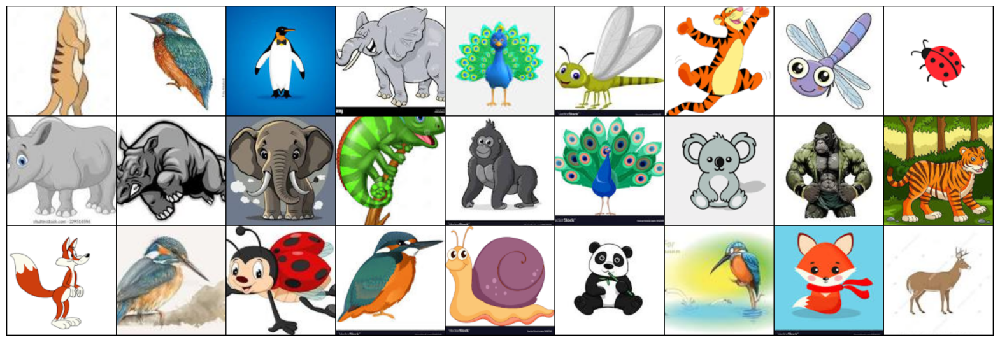

In [25]:
sample_inputs, _ = next(iter(cartoon_loader))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)

plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Got 110 / 400 correct of val set (27.50)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


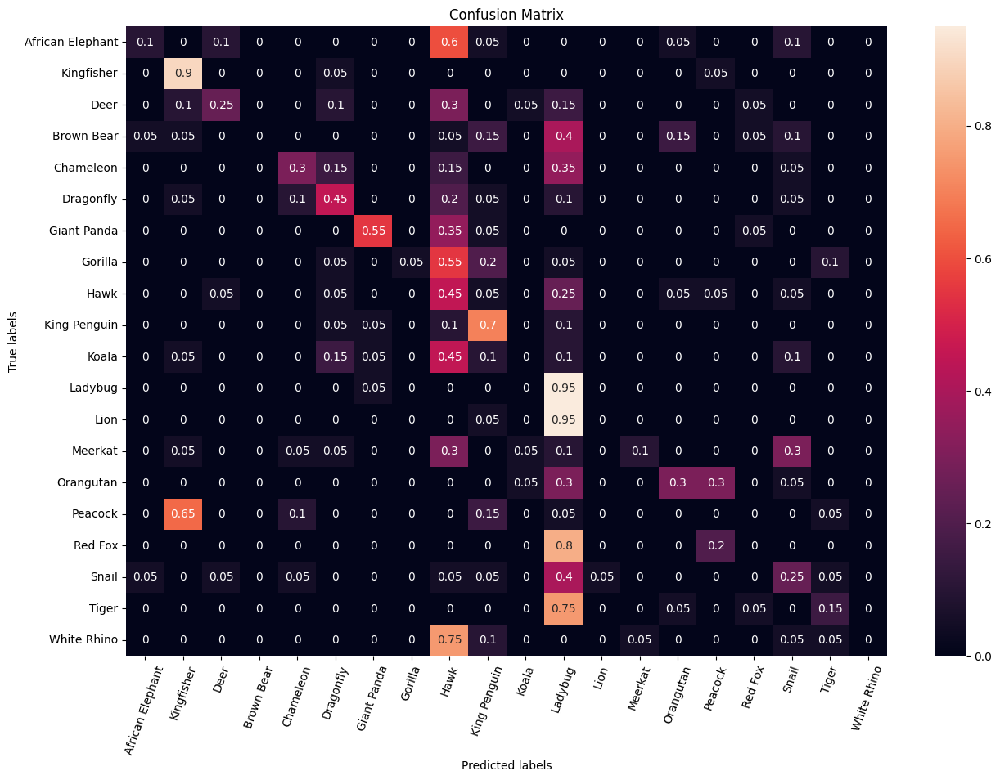

Predicted label ['King Penguin' 'Dragonfly' 'Hawk' 'Giant Panda' 'Ladybug' 'Ladybug'
 'Hawk' 'Peacock' 'Hawk']
True label ['Brown Bear' 'Chameleon' 'Brown Bear' 'Koala' 'Chameleon' 'Chameleon'
 'Koala' 'Orangutan' 'African Elephant']
Corresponding images are shown below


0.275

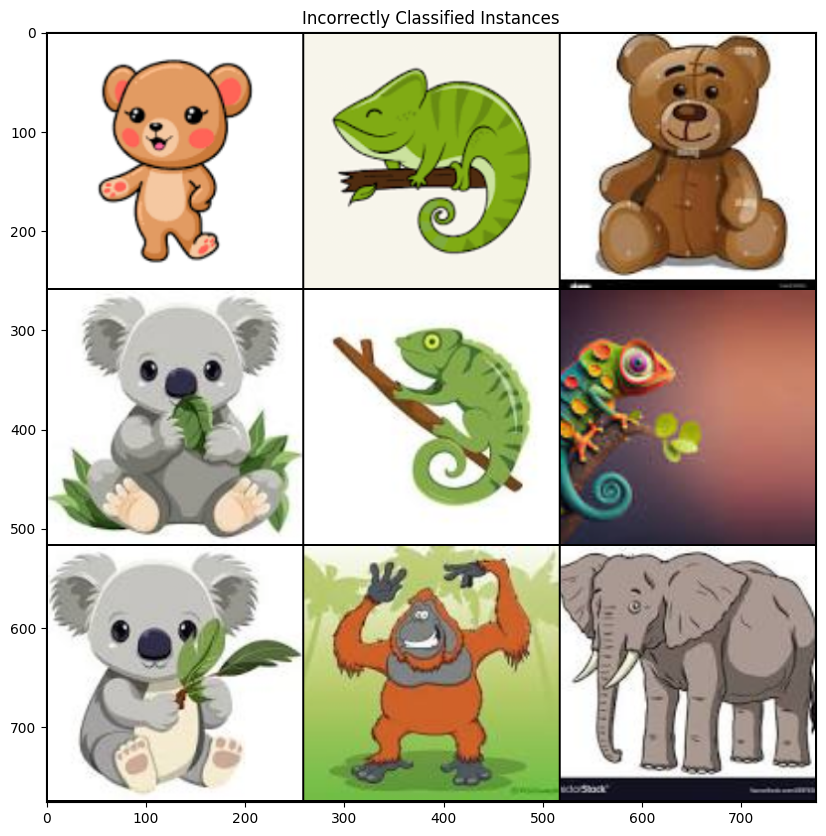

In [26]:
check_accuracy(cartoon_loader, model, analysis=True)

**Answer:**

My model performed very bad for this task as the accuracy was only 27.5%. The model was not trained on cartoon animals therefore had difficulty generalizing to classifying cartoon animals. This is because the model has learned features and patterns specific to real animals, and cartoons often depict exaggerated or stylized characteristics that may differ significantly from real-world images.

I think one method to improve the model's performance would be to have animal cartoon samples in each class when training so the training dataset is more diverse. To improve the model's performance after training our initial mode, we could fine-tune the model on a dataset of cartoon animals. This fine-tuning process could help the model adapt to the specific characteristics of cartoon images while retaining knowledge gained from real animal images

<!-- END QUESTION -->

## Part 3 (10 points)

The code provided below will allow you to visualise the feature maps computed by different layers of your network. Run the code (install matplotlib if necessary) and **answer the following questions*(: 

<!-- BEGIN QUESTION -->

### Q3.1 : Learned Features

Compare the feature maps from low-level layers to high-level layers, what do you observe? (4 points)

**Answer:**

I noticed that the feature maps of the lower-level layers resemble the image we are trying to classify more closely. It is apparent that there is a greater emphasis on lower-level features such as edges and corners, which are more prominent in the first layers compared to the subsequent layers. Thus, it seems that the lower-level layers prioritize local features, such as edges and corners, more than the higher-level layers.

Additionally, the low-level layers exhibit a higher spatial resolution in the feature maps compared to the higher-level layers, and the spatial resolution deteriorates progressively from lower to higher layers. This observation aligns with the fact that methods like max-pooling, commonly used in CNNs, downsample the image.

Furthermore, higher-level features are more abstract and complex, and due to dimension reduction at the pooling layers, they seem to capture more global features compared to the lower-level layers. 

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.2: Performance Analysis

Use the training log, reported test set accuracy and the feature maps, analyse the performance of your network. If you think the performance is sufficiently good, explain why; if not, what might be the problem and how can you improve the performance? (4 points)

**Answer:**

Overall, I think the performance of my network is sufficiently good although there is room for improvement. From the training logs, the model does appear to be learning sufficiently well, although we can see from the accuracy of some of the classes is very low. As mentioned there is class imbalance, as some classes have much more samples than others which would allow the model to generalize better on those classes. For example, the class "Koala"  which had 1599 samples had 91% of instances that are correctly classified by the model whereas, for example. "White Rhino" had 512 samples and as a result 51% of instances that are correctly classified by the model. We can also see that the  "White Rhino" is misclassified the most to be "African Elephant", this is again likely because of the smaller sample size of the white rhino class and the similarities between the two animals in terms of shape and colors. Therefore, the model was not able to generalize well amongst all classes. From the training logs,  During training the model did appear to be slightly overfitting as for epoch 6 the validation accuracy is 72.57, then for epoch 7, the validation accuracy is 71.72 but in the epochs after the validation accuracy is continuously increasing so the model was not consistently overfitting throughout training which is a good sign.

We did try using a categorical cross-entropy loss where the weights for each class were to total number of samples divided by the number of samples in the class, increasing the contribution of underrepresented classes to the overall loss during training. However, the weights were the total number of samples of the training data that was then split into a training set and validation set. Therefore I could have used the total number of samples in the training set instead of the training data as a whole. Moreover, other loss functions like focal loss could have been used to address this issue or other weights could have been experimented with. In addition, I also could have used data augmentation to increase the number of samples in underrepresented classes. 


From the feature maps, we can see that the initial layers contains most of the information within the image and act as edge detectors, but as we go deeper into the network the feature maps are much more abstract an the initial image becomes less and less recognizable. In addition, initially there is not much of a difference between the animal we are trying to classify and the background. Moreover, in the initial layers the animal body and full shape is not very well highlighted and distinguished from the background. The validation accuracy was 77.63% and the test accuracy is 75.5%. Given the small difference between them, the model appears to not have been overly overfitting the training data and has generalized relatively well. Although, similarly to the validation data, we see classes like "White Rhino" poorly classified whereas classes like "Koala" were well classified.

We could have also tried a deeper network to potentially enable the model to learn more complex and abstract features to generalize better. Moreover, we could have tried increasing the number of epochs from 10 to 15 and train for a longer time.  Furthermore, cross-validation could've also been used to assess the model's performance across different subsets of the data, providing a more robust evaluation of the model's generalization capabilities.


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.3: Alternative Evaluations

What are the other possible ways to analyse the performance of your network? (2 points)

**Answer:**

Let TP represent the number of true positives, FP represent false positives, and FN represent false negatives. Another way of analyzing the performance of my network is Precision, which is calculated as $\frac{TP}{TP+FP}$, Recall, which is calculated as $\frac{TP}{TP+FN}$, and the F1 Score, the harmonic mean of precision and recall, is defined as $2\frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}$. Precision tells us the proportion of correctly predicted positive instances among all instances predicted as positive, indicating the model's accuracy in identifying true positives. Recall helps evaluate the model by indicating the proportion of correctly predicted positive instances among all actual positive instances, showcasing the model's ability to capture true positive instances.

Moreover, the F1 score serves as a predictive measure of the model's performance. A higher F1 score signifies a more effective model, minimizing false positives and false negatives, and it would also be useful in our case where the dataset is unbalanced.

We can also utilize learning curves to plot and compare the validation and training loss per epoch. We can also plot the validation accuracy per epoch to help us better understand when the model is over-fitting or under-fitting. Additionally, I could have used cross-validation to evaluate the model better. Cross-validation involves partitioning the dataset into multiple subsets, training the model on different subsets, and then evaluating its performance on the remaining data. This process is repeated, and the performance metrics are averaged across folds, providing a more robust estimate of the model's generalization performance.

---

<!-- END QUESTION -->

**Feature Visualization**

The code below will visualize the features of your network layers (you may need to modify the layer names if you made changes to your architecture). 

If you change the plotting code, please ensure it still exports correctly when running the submission cell.

In [27]:
import matplotlib.pyplot as plt

def plot_model_features():
    fig = plt.tight_layout()
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook
    vis_labels = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4', 'layer5', 'layer6']

    for l in vis_labels:
        getattr(model, l).register_forward_hook(get_activation(l))
        

    data, _ = test_dataset[999]
    data = data.unsqueeze_(0).to(device = device, dtype = dtype)
    output = model(data)

    for idx, l in enumerate(vis_labels):
        act = activation[l].squeeze()

        # only showing the first 16 channels
        ncols, nrows = 8, 2
        
        fig, axarr = plt.subplots(nrows, ncols, figsize=(15,5))
        fig.suptitle(l)

        count = 0
        for i in range(nrows):
            for j in range(ncols):
                axarr[i, j].imshow(act[count].cpu())
                axarr[i, j].axis('off')
                count += 1

<Figure size 640x480 with 0 Axes>

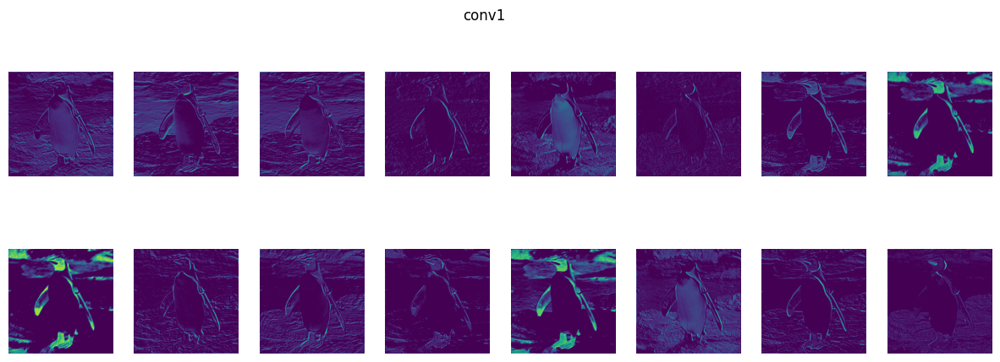

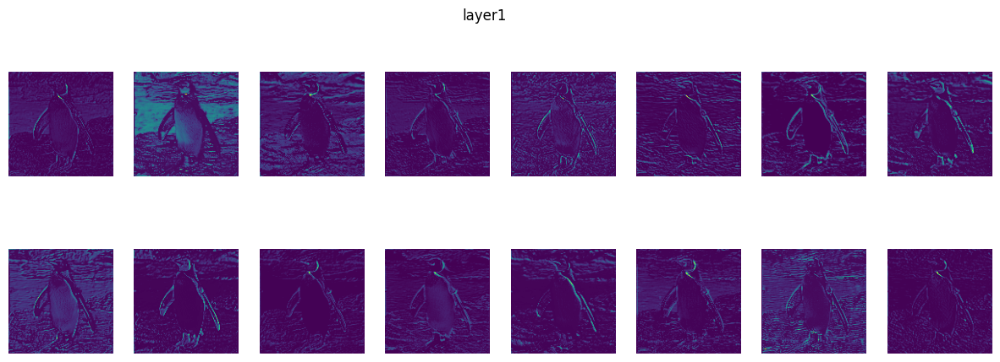

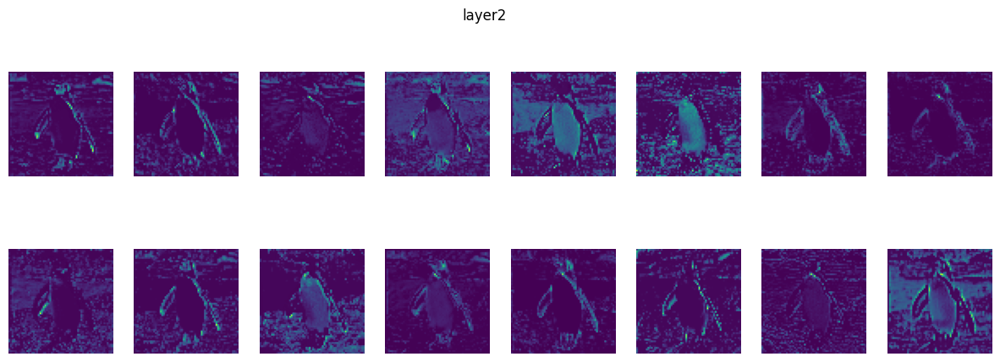

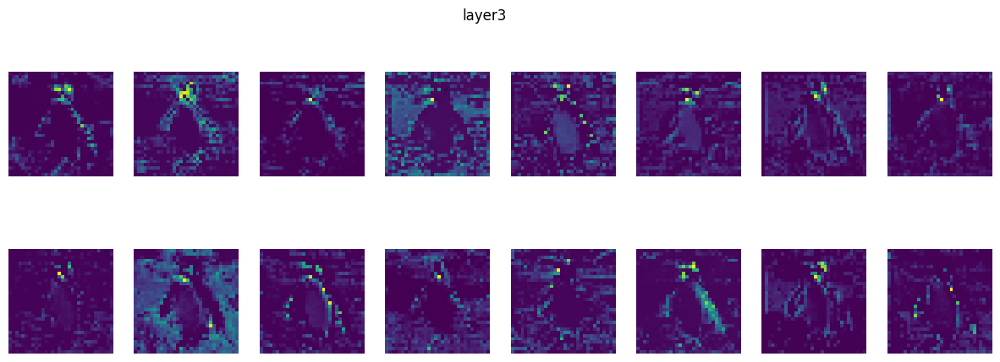

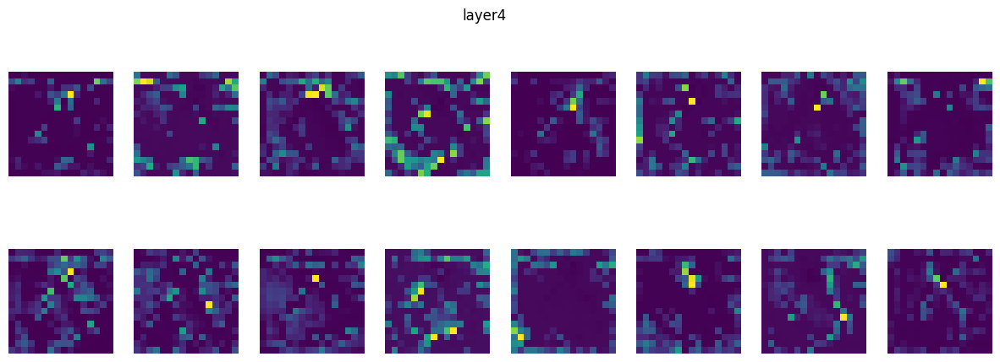

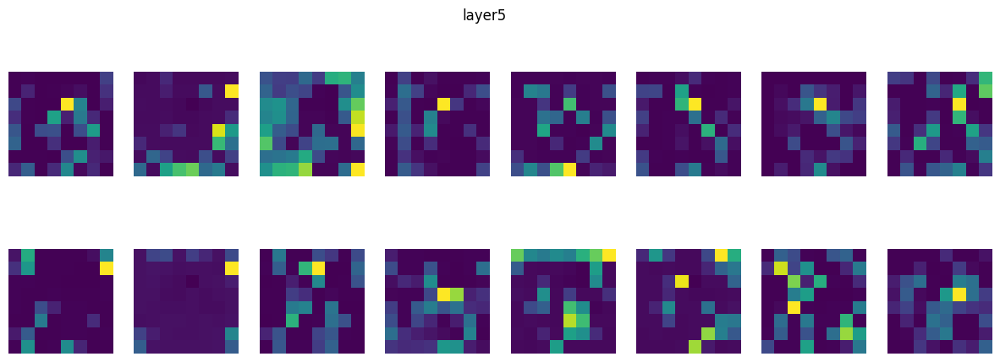

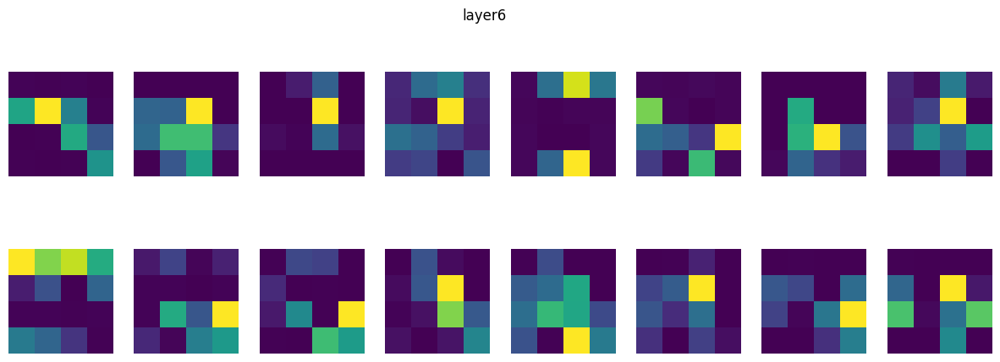

In [28]:
# Visualize the figure here, so it is exported nicely
plot_model_features()

<!-- END QUESTION -->

## Submission
Git push your finalized version of this notebook (with saved outputs) to the gitlab repo which you were assigned. You should request our tests once and check that the ```preview.pdf```:
* Passes all public tests (these are the same ones provided / embedded in the notebook itself)
* Contains your qualitative answers
* Contains your figures (confusion matrix and network features)

---

To double-check your work, the cell below will rerun all of the autograder tests.

In [33]:
grader.check_all()

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed